# Projection: Hair follicles growth cycle identification

In [1]:
%matplotlib widget
from numpy import *
from pylab import *
from scipy.io import loadmat,savemat
from scipy.ndimage import gaussian_filter,median_filter
from sklearn.preprocessing import StandardScaler
import umap

# Helper function for polarimetric superpixel

In [556]:
def Superpixel_preprocessing(data,MMpbp,clustern=1024):
    """
    Partition the Mueller matrix data into polarimetric superpixels.
    
    input Mueller matrix loadmat file and MMpbps, set the clustern, outputs the pbps for each
    polarimetric superpixels and their projection labels.
    
    dict, 3d array, int --> 2d array, 2d array
    """
    #读矩阵数据
    temp=[]
    parameters=['FinalM11','FinalM12','FinalM13','FinalM14',
         'FinalM21','FinalM22','FinalM23','FinalM24',
         'FinalM31','FinalM32','FinalM33','FinalM34',
         'FinalM41','FinalM42','FinalM43','FinalM44']
    for para in parameters:
        temp.append( data[para] )
    MM=stack(temp,axis=2)
    MM[:,:,0]=1.
    
    #对矩阵阵元进行高斯滤波
    #MM_=zeros(MM.shape)
    #for i in range(1,16):
    #    MM_[:,:,i]=gaussian_filter(MM[:,:,i],5) #
    #MM_[:,:,0]=1.
    #MM=MM_.copy()
    
    #进行超像素计算
    ss=StandardScaler()
    xx=ss.fit_transform(  MM.reshape(MM.shape[0]*MM.shape[1],MM.shape[2]))
    from sklearn.cluster import MiniBatchKMeans
    minikm=MiniBatchKMeans(n_clusters=clustern,batch_size=10*clustern,random_state=2021214521)
    minikm.fit(xx)
        
    #总结以及输出结果
    groups=[]
    for i in range(clustern):
        groups.append(MMpbp[minikm.labels_.reshape(MM.shape[:2])==i].mean(axis=0))
    groups=array(groups)

    return groups, minikm.labels_.reshape(MM.shape[:2])

# Define path

In [2]:
fc2=['data/2_con1','data/2_con2','data/2_con3','data/2_con4','data/2_con5',
    'data/2_con6','data/2_con7','data/2_con8','data/2_con9','data/2_con10',
    'data/2_con11','data/2_con12','data/2_con13','data/2_con14','data/2_con15',
    'data/2_con16','data/2_con17','data/2_con18','data/2_con19','data/2_con20',
    'data/2_con21','data/2_con22','data/2_con23','data/2_con24','data/2_con25',
    'data/2_con26','data/2_con27','data/2_con28','data/2_con29','data/2_con30',
    'data/2_con31','data/2_con32','data/2_con33','data/2_con34','data/2_con35',
    'data/2_con36','data/2_con37','data/2_con38','data/2_con39','data/2_con40']
fc4=['data/4_con1','data/4_con2','data/4_con3','data/4_con4','data/4_con5',
    'data/4_con6','data/4_con7','data/4_con8','data/4_con9','data/4_con10',
    'data/4_con11','data/4_con12']
fc6=['data/6_con1','data/6_con2','data/6_con3','data/6_con4','data/6_con5',
    'data/6_con6','data/6_con7','data/6_con8','data/6_con9','data/6_con10',
    'data/6_con11','data/6_con12']
fc8=['data/8_con1','data/8_con2','data/8_con3','data/8_con4','data/8_con5',
    'data/8_con6','data/8_con7','data/8_con8','data/8_con9','data/8_con10',
    'data/8_con11','data/8_con12']
fc10=['data/10_con1','data/10_con2','data/10_con3','data/10_con4','data/10_con5',
    'data/10_con6','data/10_con7','data/10_con8','data/10_con9','data/10_con10',
    'data/10_con11','data/10_con12']
fc12=['data/12_con1','data/12_con2','data/12_con3','data/12_con4','data/12_con5',
    'data/12_con6','data/12_con7','data/12_con8','data/12_con9','data/12_con10',
    'data/12_con11','data/12_con12']
fc14=['data/14_con1','data/14_con2','data/14_con3','data/14_con4','data/14_con5',
    'data/14_con6','data/14_con7','data/14_con8','data/14_con9','data/14_con10',
    'data/14_con11','data/14_con12']
fc16=['data/16_con1','data/16_con2','data/16_con3','data/16_con4','data/16_con5',
    'data/16_con6','data/16_con7','data/16_con8','data/16_con9','data/16_con10',
    'data/16_con11','data/16_con12']
fc18=['data/18_con1','data/18_con2','data/18_con3','data/18_con4','data/18_con5',
    'data/18_con6','data/18_con7','data/18_con8','data/18_con9','data/18_con10',
    'data/18_con11','data/18_con12']
fc20=['data/20_con1','data/20_con2','data/20_con3','data/20_con4','data/20_con5',
    'data/20_con6','data/20_con7','data/20_con8','data/20_con9','data/20_con10',
    'data/20_con11','data/20_con12']
fc22=['data/22_con1','data/22_con2','data/22_con3','data/22_con4','data/22_con5',
    'data/22_con6','data/22_con7','data/22_con8','data/22_con9','data/22_con10',
    'data/22_con11','data/22_con12']
fc24=['data/24_con1','data/24_con2','data/24_con3','data/24_con4','data/24_con5',
    'data/24_con6','data/24_con7','data/24_con8','data/24_con9','data/24_con10',
    'data/24_con11','data/24_con12']
fc26=['data/26_con1','data/26_con2','data/26_con3','data/26_con4','data/26_con5',
    'data/26_con6','data/26_con7','data/26_con8','data/26_con9','data/26_con10',
    'data/26_con11','data/26_con12']

fc=['data/2_con1','data/2_con2','data/2_con3','data/2_con4','data/2_con5',
    'data/2_con6','data/2_con7','data/2_con8','data/2_con9','data/2_con10',
    'data/2_con11','data/2_con12','data/2_con13','data/2_con14','data/2_con15',
    'data/2_con16','data/2_con17','data/2_con18','data/2_con19','data/2_con20',
    'data/2_con21','data/2_con22','data/2_con23','data/2_con24','data/2_con25',
    'data/2_con26','data/2_con27','data/2_con28','data/2_con29','data/2_con30',
    'data/2_con31','data/2_con32','data/2_con33','data/2_con34','data/2_con35',
    'data/2_con36','data/2_con37','data/2_con38','data/2_con39','data/2_con40',
    'data/4_con1','data/4_con2','data/4_con3','data/4_con4','data/4_con5',
    'data/4_con6','data/4_con7','data/4_con8','data/4_con9','data/4_con10',
    'data/4_con11','data/4_con12',
    'data/6_con1','data/6_con2','data/6_con3','data/6_con4','data/6_con5',
    'data/6_con6','data/6_con7','data/6_con8','data/6_con9','data/6_con10',
    'data/6_con11','data/6_con12',
    'data/8_con1','data/8_con2','data/8_con3','data/8_con4','data/8_con5',
    'data/8_con6','data/8_con7','data/8_con8','data/8_con9','data/8_con10',
    'data/8_con11','data/8_con12',
    'data/10_con1','data/10_con2','data/10_con3','data/10_con4','data/10_con5',
    'data/10_con6','data/10_con7','data/10_con8','data/10_con9','data/10_con10',
    'data/10_con11','data/10_con12',
    'data/12_con1','data/12_con2','data/12_con3','data/12_con4','data/12_con5',
    'data/12_con6','data/12_con7','data/12_con8','data/12_con9','data/12_con10',
    'data/12_con11','data/12_con12',
    'data/14_con1','data/14_con2','data/14_con3','data/14_con4','data/14_con5',
    'data/14_con6','data/14_con7','data/14_con8','data/14_con9','data/14_con10',
    'data/14_con11','data/14_con12',
    'data/16_con1','data/16_con2','data/16_con3','data/16_con4','data/16_con5',
    'data/16_con6','data/16_con7','data/16_con8','data/16_con9','data/16_con10',
    'data/16_con11','data/16_con12',
    'data/18_con1','data/18_con2','data/18_con3','data/18_con4','data/18_con5',
    'data/18_con6','data/18_con7','data/18_con8','data/18_con9','data/18_con10',
    'data/18_con11','data/18_con12',
    'data/20_con1','data/20_con2','data/20_con3','data/20_con4','data/20_con5',
    'data/20_con6','data/20_con7','data/20_con8','data/20_con9','data/20_con10',
    'data/20_con11','data/20_con12',
    'data/22_con1','data/22_con2','data/22_con3','data/22_con4','data/22_con5',
    'data/22_con6','data/22_con7','data/22_con8','data/22_con9','data/22_con10',
    'data/22_con11','data/22_con12',
    'data/24_con1','data/24_con2','data/24_con3','data/24_con4','data/24_con5',
    'data/24_con6','data/24_con7','data/24_con8','data/24_con9','data/24_con10',
    'data/24_con11','data/24_con12',
    'data/26_con1','data/26_con2','data/26_con3','data/26_con4','data/26_con5',
    'data/26_con6','data/26_con7','data/26_con8','data/26_con9','data/26_con10',
    'data/26_con11','data/26_con12']

In [3]:
ft2=['data/2_T1','data/2_T2','data/2_T3','data/2_T4','data/2_T5','data/2_T6',
    'data/2_T7','data/2_T8','data/2_T9','data/2_T10','data/2_T11','data/2_T12',
    'data/2_T13','data/2_T14','data/2_T15','data/2_T16','data/2_T17','data/2_T18',
    'data/2_T19','data/2_T20','data/2_T21','data/2_T22','data/2_T23','data/2_T24',
    'data/2_T25','data/2_T26','data/2_T27','data/2_T28','data/2_T29','data/2_T30',
    'data/2_T31','data/2_T32','data/2_T33','data/2_T34','data/2_T35','data/2_T36',
    'data/2_T37','data/2_T38','data/2_T39','data/2_T40']
ft4=['data/4_T1','data/4_T2','data/4_T3','data/4_T4','data/4_T5','data/4_T6',
    'data/4_T7','data/4_T8','data/4_T9','data/4_T10','data/4_T11','data/4_T12']
ft6=[    'data/6_T1','data/6_T2','data/6_T3','data/6_T4','data/6_T5','data/6_T6',
    'data/6_T7','data/6_T8','data/6_T9','data/6_T10','data/6_T11','data/6_T12']
ft8=[    'data/8_T1','data/8_T2','data/8_T3','data/8_T4','data/8_T5','data/8_T6',
    'data/8_T7','data/8_T8','data/8_T9','data/8_T10','data/8_T11','data/8_T12']
ft10=[    'data/10_T1','data/10_T2','data/10_T3','data/10_T4','data/10_T5','data/10_T6',
    'data/10_T7','data/10_T8','data/10_T9','data/10_T10','data/10_T11','data/10_T12']
ft12=[    'data/12_T1','data/12_T2','data/12_T3','data/12_T4','data/12_T5','data/12_T6',
    'data/12_T7','data/12_T8','data/12_T9','data/12_T10','data/12_T11','data/12_T12']
ft14=[    'data/14_T1','data/14_T2','data/14_T3','data/14_T4','data/14_T5','data/14_T6',
    'data/14_T7','data/14_T8','data/14_T9','data/14_T10','data/14_T11','data/14_T12']
ft16=[    'data/16_T1','data/16_T2','data/16_T3','data/16_T4','data/16_T5','data/16_T6',
    'data/16_T7','data/16_T8','data/16_T9','data/16_T10','data/16_T11','data/16_T12']
ft18=[    'data/18_T1','data/18_T2','data/18_T3','data/18_T4','data/18_T5','data/18_T6',
    'data/18_T7','data/18_T8','data/18_T9','data/18_T10','data/18_T11','data/18_T12']
ft20=[    'data/20_T1','data/20_T2','data/20_T3','data/20_T4','data/20_T5','data/20_T6',
    'data/20_T7','data/20_T8','data/20_T9','data/20_T10','data/20_T11','data/20_T12']
ft22=[    'data/22_T1','data/22_T2','data/22_T3','data/22_T4','data/22_T5','data/22_T6',
    'data/22_T7','data/22_T8','data/22_T9','data/22_T10','data/22_T11','data/22_T12']
ft24=[    'data/24_T1','data/24_T2','data/24_T3','data/24_T4','data/24_T5','data/24_T6',
    'data/24_T7','data/24_T8','data/24_T9','data/24_T10','data/24_T11','data/24_T12']
ft26=[    'data/26_T1','data/26_T2','data/26_T3','data/26_T4','data/26_T5','data/26_T6',
    'data/26_T7','data/26_T8','data/26_T9','data/26_T10','data/26_T11','data/26_T12']

ft=['data/2_T1','data/2_T2','data/2_T3','data/2_T4','data/2_T5','data/2_T6',
    'data/2_T7','data/2_T8','data/2_T9','data/2_T10','data/2_T11','data/2_T12',
    'data/2_T13','data/2_T14','data/2_T15','data/2_T16','data/2_T17','data/2_T18',
    'data/2_T19','data/2_T20','data/2_T21','data/2_T22','data/2_T23','data/2_T24',
    'data/2_T25','data/2_T26','data/2_T27','data/2_T28','data/2_T29','data/2_T30',
    'data/2_T31','data/2_T32','data/2_T33','data/2_T34','data/2_T35','data/2_T36',
    'data/2_T37','data/2_T38','data/2_T39','data/2_T40',
    'data/4_T1','data/4_T2','data/4_T3','data/4_T4','data/4_T5','data/4_T6',
    'data/4_T7','data/4_T8','data/4_T9','data/4_T10','data/4_T11','data/4_T12',
    'data/6_T1','data/6_T2','data/6_T3','data/6_T4','data/6_T5','data/6_T6',
    'data/6_T7','data/6_T8','data/6_T9','data/6_T10','data/6_T11','data/6_T12',
    'data/8_T1','data/8_T2','data/8_T3','data/8_T4','data/8_T5','data/8_T6',
    'data/8_T7','data/8_T8','data/8_T9','data/8_T10','data/8_T11','data/8_T12',
    'data/10_T1','data/10_T2','data/10_T3','data/10_T4','data/10_T5','data/10_T6',
    'data/10_T7','data/10_T8','data/10_T9','data/10_T10','data/10_T11','data/10_T12',
    'data/12_T1','data/12_T2','data/12_T3','data/12_T4','data/12_T5','data/12_T6',
    'data/12_T7','data/12_T8','data/12_T9','data/12_T10','data/12_T11','data/12_T12',
    'data/14_T1','data/14_T2','data/14_T3','data/14_T4','data/14_T5','data/14_T6',
    'data/14_T7','data/14_T8','data/14_T9','data/14_T10','data/14_T11','data/14_T12',
    'data/16_T1','data/16_T2','data/16_T3','data/16_T4','data/16_T5','data/16_T6',
    'data/16_T7','data/16_T8','data/16_T9','data/16_T10','data/16_T11','data/16_T12',
    'data/18_T1','data/18_T2','data/18_T3','data/18_T4','data/18_T5','data/18_T6',
    'data/18_T7','data/18_T8','data/18_T9','data/18_T10','data/18_T11','data/18_T12',
    'data/20_T1','data/20_T2','data/20_T3','data/20_T4','data/20_T5','data/20_T6',
    'data/20_T7','data/20_T8','data/20_T9','data/20_T10','data/20_T11','data/20_T12',
    'data/22_T1','data/22_T2','data/22_T3','data/22_T4','data/22_T5','data/22_T6',
    'data/22_T7','data/22_T8','data/22_T9','data/22_T10','data/22_T11','data/22_T12',
    'data/24_T1','data/24_T2','data/24_T3','data/24_T4','data/24_T5','data/24_T6',
    'data/24_T7','data/24_T8','data/24_T9','data/24_T10','data/24_T11','data/24_T12',
    'data/26_T1','data/26_T2','data/26_T3','data/26_T4','data/26_T5','data/26_T6',
    'data/26_T7','data/26_T8','data/26_T9','data/26_T10','data/26_T11','data/26_T12']

# Select group

In [4]:
fl=fc2[0:12]+fc4+fc6+fc8+fc10+fc12+fc14+fc16+fc18+fc20+fc22+fc24+fc26

In [827]:
fl=ft2[0:12]+ft4+ft6+ft8+ft10+ft12+ft14+ft16+ft18+ft20+ft22+ft24+ft26

In [5]:
print(fl)
print(size(fl))

['data/2_con1', 'data/2_con2', 'data/2_con3', 'data/2_con4', 'data/2_con5', 'data/2_con6', 'data/2_con7', 'data/2_con8', 'data/2_con9', 'data/2_con10', 'data/2_con11', 'data/2_con12', 'data/4_con1', 'data/4_con2', 'data/4_con3', 'data/4_con4', 'data/4_con5', 'data/4_con6', 'data/4_con7', 'data/4_con8', 'data/4_con9', 'data/4_con10', 'data/4_con11', 'data/4_con12', 'data/6_con1', 'data/6_con2', 'data/6_con3', 'data/6_con4', 'data/6_con5', 'data/6_con6', 'data/6_con7', 'data/6_con8', 'data/6_con9', 'data/6_con10', 'data/6_con11', 'data/6_con12', 'data/8_con1', 'data/8_con2', 'data/8_con3', 'data/8_con4', 'data/8_con5', 'data/8_con6', 'data/8_con7', 'data/8_con8', 'data/8_con9', 'data/8_con10', 'data/8_con11', 'data/8_con12', 'data/10_con1', 'data/10_con2', 'data/10_con3', 'data/10_con4', 'data/10_con5', 'data/10_con6', 'data/10_con7', 'data/10_con8', 'data/10_con9', 'data/10_con10', 'data/10_con11', 'data/10_con12', 'data/12_con1', 'data/12_con2', 'data/12_con3', 'data/12_con4', 'data/12

# Superpixel preprocessing 

In [ ]:
ss=StandardScaler()
for file_path in fl:
    print(file_path)
    data=loadmat(file_path+'/FinalMM.mat')
    MMpbp=loadmat(file_path+'/pbps.mat') ['pbps']
    MMpbp_1=ss.fit_transform( MMpbp.reshape(MMpbp.shape[0]*MMpbp.shape[1],MMpbp.shape[2]))
    MMpbp=MMpbp_1.reshape(MMpbp.shape[0],MMpbp.shape[1],MMpbp.shape[2])
    groups,km_labels=Superpixel_preprocessing(data,MMpbp,clustern=1024)
        
    savemat(file_path+'/groups.mat',{'groups':groups})
    savemat(file_path+'/km_labels.mat',{'km_labels':km_labels})

# Make total groups

In [19]:
total_groups=[]

for path_ in fl:
    file_path=path_+'/'
    total_groups.append(loadmat(file_path+'groups')['groups'])
total_groups=concatenate(total_groups,axis=0)

ss=StandardScaler()
xxx_=ss.fit_transform(total_groups[:])

In [6]:
total_groups=[]

for path_ in fl:
    file_path=path_+'/'
    total_groups.append(loadmat(file_path+'nuclear_groups_1')['nuclear_groups'])
total_groups=concatenate(total_groups,axis=0)

ss=StandardScaler()
xxx_=ss.fit_transform(total_groups[:])

FileNotFoundError: [Errno 2] No such file or directory: 'data/2_con1/nuclear_groups_1.mat'

In [7]:
print(shape(xxx_))

NameError: name 'xxx_' is not defined

# UMAP projection

In [20]:
import umap
umap_reducer=umap.UMAP(n_components=2,n_neighbors=30,min_dist=0.0,metric='canberra',spread=1.,
                       verbose=True,random_state=2021214521,n_epochs=200)
trans=umap_reducer.fit(xxx_[:])

UMAP(metric='canberra', min_dist=0.0, n_epochs=200, n_neighbors=30, random_state=2021214521, verbose=True)
Sun Mar 12 18:51:35 2023 Construct fuzzy simplicial set
Sun Mar 12 18:51:35 2023 Finding Nearest Neighbors
Sun Mar 12 18:51:35 2023 Building RP forest with 11 trees
Sun Mar 12 18:51:35 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	 4  /  14
	Stopping threshold met -- exiting after 4 iterations
Sun Mar 12 18:51:35 2023 Finished Nearest Neighbor Search
Sun Mar 12 18:51:35 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Mar 12 18:51:43 2023 Finished embedding


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<AxesSubplot:>

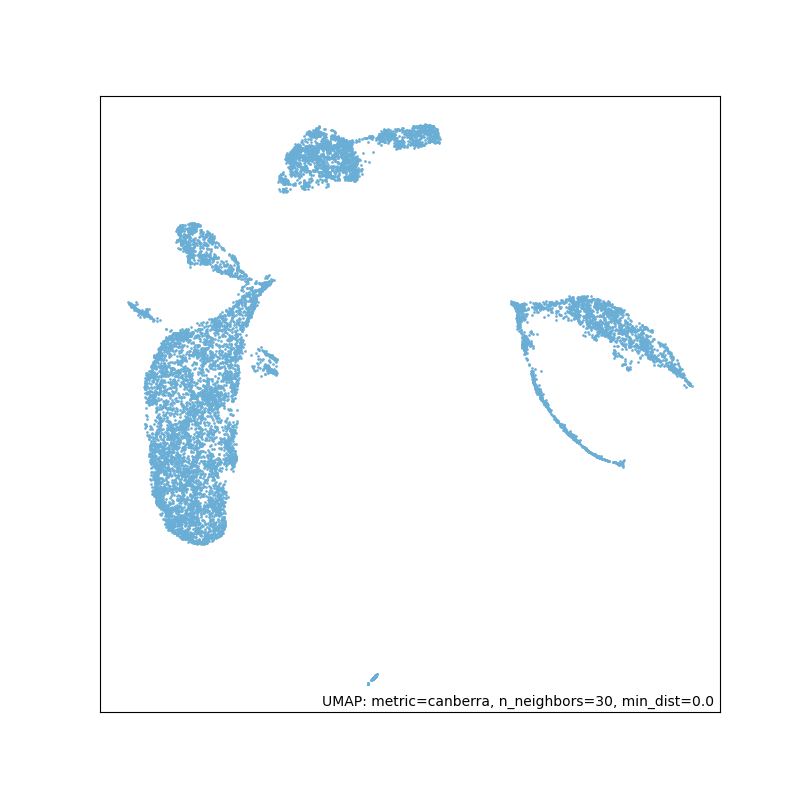

In [21]:
import umap.plot
umap.plot.points(trans)

In [22]:
p=umap.plot.interactive(trans,point_size=1)
umap.plot.show(p)

In [830]:
xxx=trans.transform(xxx_[:,]).astype('float16')

In [ ]:
from bokeh.plotting import figure, output_file, show,output_notebook
from bokeh.models import BoxSelectTool, BoxZoomTool, LassoSelectTool,ColumnDataSource,CustomJS
from bokeh.layouts import row
from bokeh.plotting import figure
from bokeh.transform import jitter
output_notebook()
s1=ColumnDataSource(data=dict(x=xxx[:,0],y=xxx[:,1]))
p1 = figure(plot_width=750, plot_height=500,tools="box_select,box_zoom,lasso_select,reset,save")
p1.dot('x','y',source=s1,size=5,color="#386CB0", fill_color=None)
p1.grid.grid_line_color=None

s2 = ColumnDataSource(data=dict(x=[], y=[]))
p2 = figure(width=750, height=500,
            tools="", title="Watch Here")
p2.dot('x', 'y', source=s2)

s1.selected.js_on_change('indices', CustomJS(args=dict(s1=s1, s2=s2), code="""
        const inds = cb_obj.indices
        const d1 = s1.data
        const x = Array.from(inds, (i) => d1.x[i])
        const y = Array.from(inds, (i) => d1.y[i])
        s2.data = { x, y }
    """)
)

layout = row(p1, p2)

show(layout)

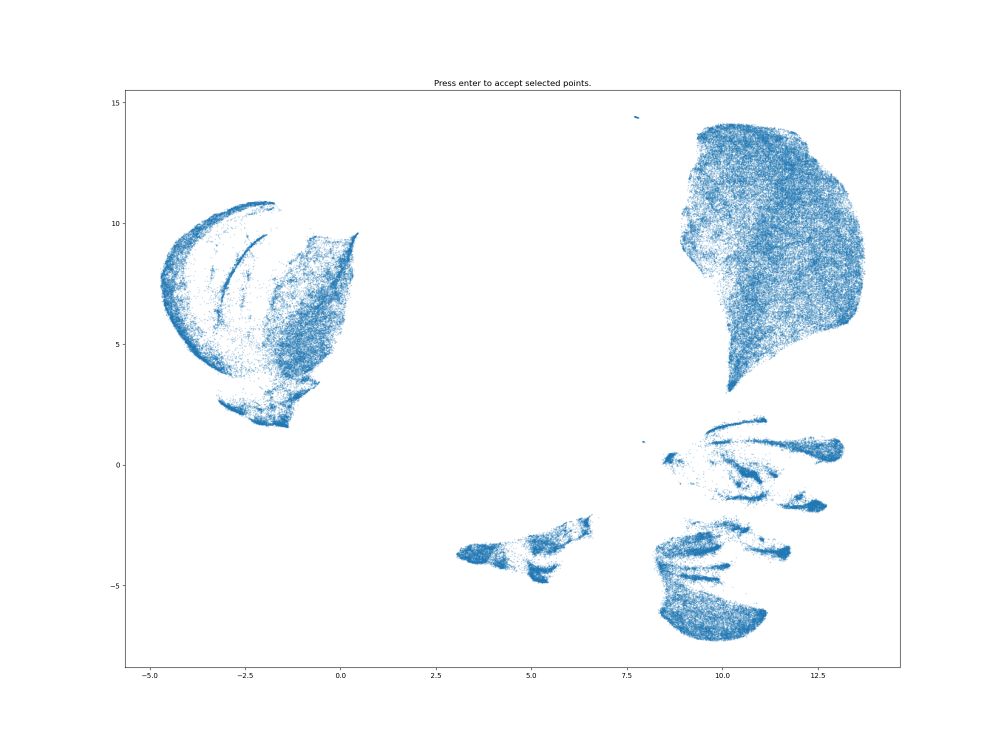

In [831]:
%matplotlib widget
import numpy as np
from matplotlib.widgets import LassoSelector
from matplotlib.path import Path

class SelectFromCollection:
    """
    Select indices from a matplotlib collection using `LassoSelector`.

    Selected indices are saved in the `ind` attribute. This tool fades out the
    points that are not part of the selection (i.e., reduces their alpha
    values). If your collection has alpha < 1, this tool will permanently
    alter the alpha values.

    Note that this tool selects collection objects based on their *origins*
    (i.e., `offsets`).

    Parameters
    ----------
    ax : `~matplotlib.axes.Axes`
        Axes to interact with.
    collection : `matplotlib.collections.Collection` subclass
        Collection you want to select from.
    alpha_other : 0 <= float <= 1
        To highlight a selection, this tool sets all selected points to an
        alpha value of 1 and non-selected points to *alpha_other*.
    """

    def __init__(self, ax, collection, alpha_other=0.3):
        self.canvas = ax.figure.canvas
        self.collection = collection
        self.alpha_other = alpha_other

        self.xys = collection.get_offsets()
        self.Npts = len(self.xys)

        # Ensure that we have separate colors for each object
        self.fc = collection.get_facecolors()
        if len(self.fc) == 0:
            raise ValueError('Collection must have a facecolor')
        elif len(self.fc) == 1:
            self.fc = np.tile(self.fc, (self.Npts, 1))

        self.lasso = LassoSelector(ax, onselect=self.onselect)
        self.ind = []

    def onselect(self, verts):
        path = Path(verts)
        self.ind = np.nonzero(path.contains_points(self.xys))[0]
        self.fc[:, -1] = self.alpha_other
        self.fc[self.ind, -1] = 1
        self.collection.set_facecolors(self.fc)
        self.canvas.draw_idle()

    def disconnect(self):
        self.lasso.disconnect_events()
        self.fc[:, -1] = 1
        self.collection.set_facecolors(self.fc)
        self.canvas.draw_idle()


if __name__ == '__main__':
    import matplotlib.pyplot as plt

    # Fixing random state for reproducibility


#     subplot_kw = dict(xlim=(0, 1), ylim=(0, 1), autoscale_on=False)
    fig, ax = plt.subplots(1,1,figsize=(20,15))

    pts = ax.scatter(xxx[:, 0], xxx[:, 1], s=1,alpha=0.2)
    selector = SelectFromCollection(ax, pts)

    def accept(event):
        if event.key == "enter":
            print("Selected points:")
            print(selector.xys[selector.ind])
            selector.disconnect()
            ax.set_title("")
            fig.canvas.draw()
   
    fig.canvas.mpl_connect("key_press_event", accept)
    ax.set_title("Press enter to accept selected points.")

    plt.show()

In [547]:
cluster3=selector.ind.copy()
print(shape(cluster3))
cluster_labels_3=zeros( len(xxx) )
for i in cluster3:
    cluster_labels_3[i]=1

(7435,)


In [548]:
cluster_labels_=cluster_labels_1+cluster_labels_2+cluster_labels_3

In [549]:
savemat('cluster_labels_.mat',{'cluster_labels_':cluster_labels_})

In [550]:
for ii in [0]:
    n=fl[ii]
    lab_test=loadmat(n+'/km_labels.mat')['km_labels']
    m11=loadmat(n+'/FinalMM.mat')['CalibratedM11']
    cn=lab_test.max()+1
    fin_img=zeros(lab_test.shape[:2])
    for i in range(cn):
        fin_img[lab_test==i]=fin_img[lab_test==i]+cluster_labels_[(ii)*cn:(ii+1)*cn][i]
#plt.savefig('cluster.png', dpi=500, bbox_inches='tight')

In [543]:
cluster1=selector.ind.copy()
print(shape(cluster1))
cluster_labels_=zeros( len(xxx) )
for i in cluster1:
    cluster_labels_[i]=1
    
for ii in [88]:
    n=fl[ii]
    lab_test=loadmat(n+'/km_labels.mat')['km_labels']
    m11=loadmat(n+'/FinalMM.mat')['CalibratedM11']
    cn=lab_test.max()+1
    fin_img=zeros(lab_test.shape[:2])
    for i in range(cn):
        fin_img[lab_test==i]=fin_img[lab_test==i]+cluster_labels_[(ii)*cn:(ii+1)*cn][i]
#plt.savefig('cluster.png', dpi=500, bbox_inches='tight')

(74,)


In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,10))
ax1=subplot(1,2,1)
ax1.imshow(m11,cmap='gray')
savemat('m11.mat',{'m11':m11})
axis('off')
ax2=subplot(1,2,2)
ax2=imshow(fin_img,'hot')
axis('off')
savemat('fin_img.mat',{'fin_img':fin_img})

In [ ]:
print(shape(total_groups))
print(shape(cluster_labels_))
q=transpose(total_groups[ 49152:61440])
a=cluster_labels_[0:12288]*q
b=transpose(a)
con_a=[]
for i in range(0,12288):
    if cluster_labels_[i] == 1:
        con_a.append(b[i,:])    
print(shape(b))
print(shape(con_a))
savemat('con_a.mat',{'con_a':con_a})

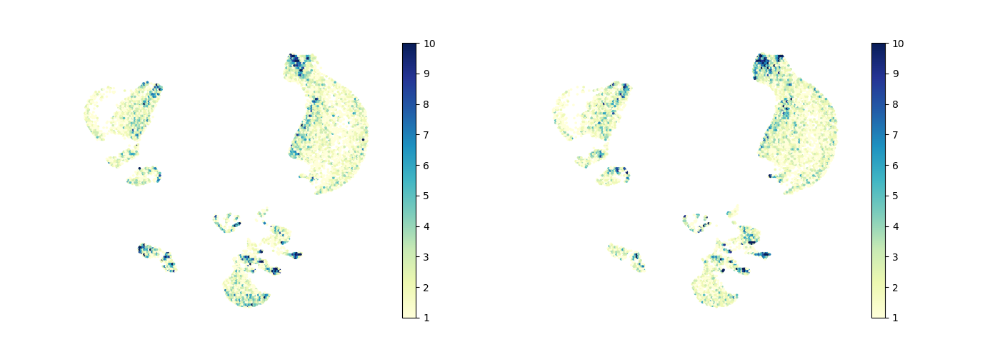

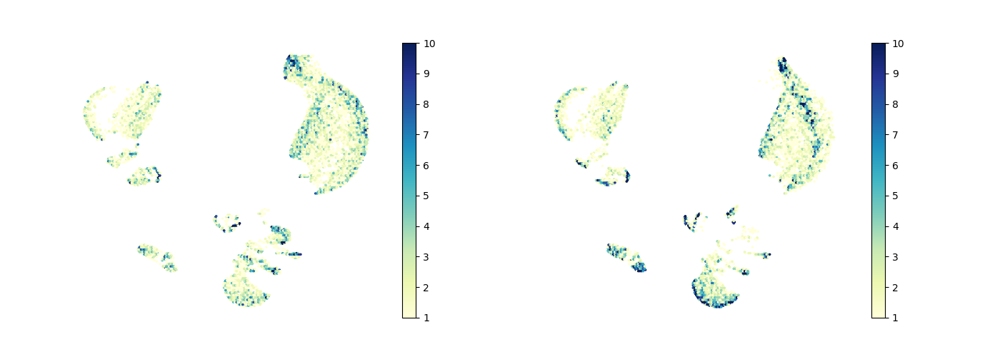

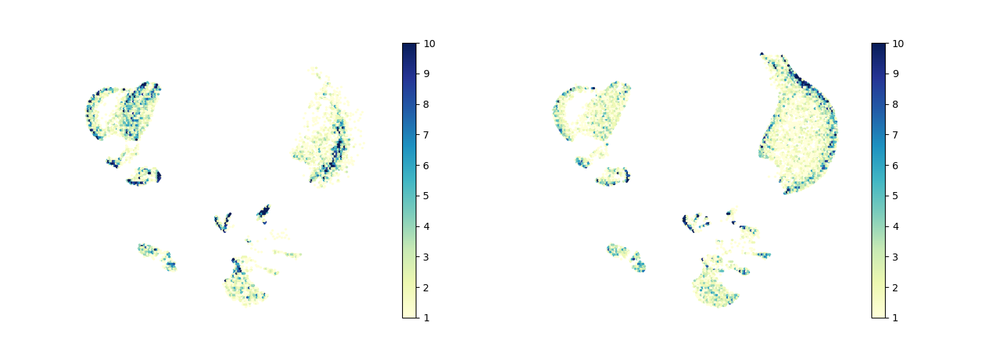

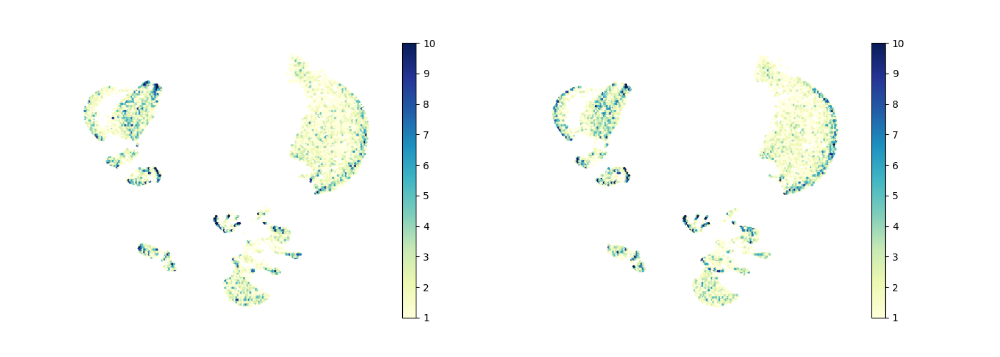

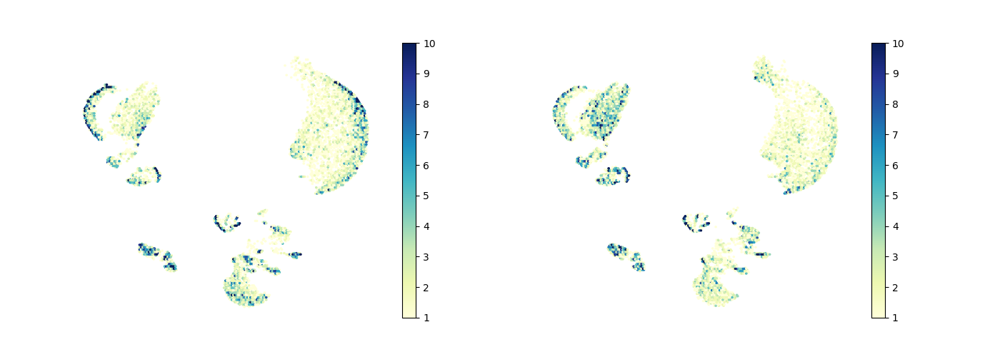

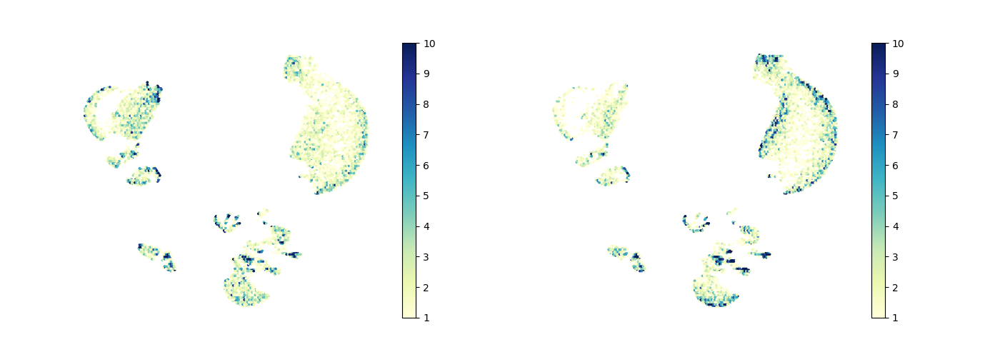

IndexError: index 14 is out of bounds for axis 0 with size 14

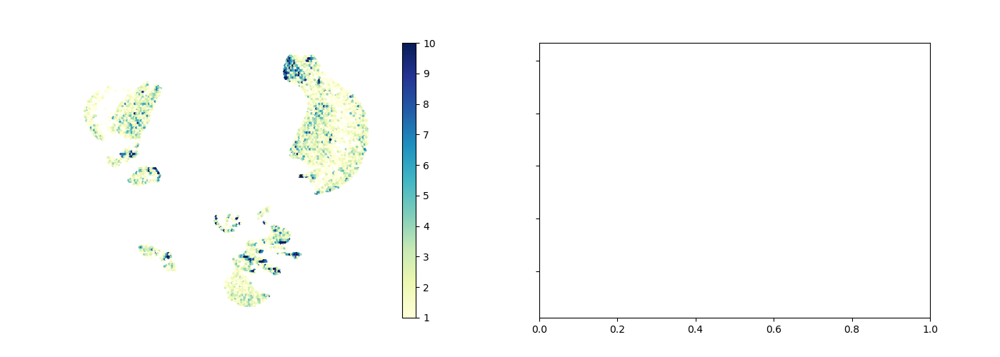

In [568]:
num=array(range(0,159744+1,12288))
h=size(num)
for i in range(0,13,2):
    x = xxx[num[i]:num[i+1],0]
    y = xxx[num[i]:num[i+1],1]
    xmin = xxx[:,0].min()-1
    xmax = xxx[:,0].max()+1
    ymin = xxx[:,1].min()-1
    ymax = xxx[:,1].max()+1
    fig, axs = plt.subplots(ncols=2, sharey=True, figsize=(14,5))
    fig.subplots_adjust(hspace=0.5, left=0.07, right=0.93)
    ax = axs[0]
    hb = ax.hexbin(x, y, gridsize=200, cmap='YlGnBu',vmax=10,extent =  (xmin, xmax, ymin, ymax),mincnt=1)
    ax.axis('off')
    ax.set(xlim=(xmin, xmax), ylim=(ymin, ymax))
    cb = fig.colorbar(hb, ax=ax)
    
    x = xxx[num[i+1]:num[i+2],0]
    y = xxx[num[i+1]:num[i+2],1]
    xmin = xxx[:,0].min()-1
    xmax = xxx[:,0].max()+1
    ymin = xxx[:,1].min()-1
    ymax = xxx[:,1].max()+1
    ax = axs[1]
    hb = ax.hexbin(x, y, gridsize=200, cmap='YlGnBu',vmax=10,extent =  (xmin, xmax, ymin, ymax),mincnt=1)
    ax.axis('off')
    ax.set(xlim=(xmin, xmax), ylim=(ymin, ymax))
    cb = fig.colorbar(hb, ax=ax)
    
    plt.savefig('test'+str(i)+'.png', dpi=500, bbox_inches='tight')
    plt.show()
    tight_layout()
    

# Person Correlation Coefficient

In [ ]:
def Calculate_pixnum(Cluster_1 ,roi_num=31):
    """
    Calculate pixel numbers of specific cluster
    Cluster_1: int list, specific cluster include super pixel
    roi_num: int
    pixnum: int list, pixel numbers of cluster in roi
    """
    pt = 0
    pixnum = []

    for t in range(0,roi_num*1024+1):
        if (t%1024)==0:
            ind = t//1024 - 1
            inx = ind + 1
            if inx < roi_num:
                sup_pix = loadmat(fl[inx]+'/no_emp_km_labels.mat')['ne_km_labels']
            if t!=0:
                pixnum.append(pt)
            pt = 0
        if t in Cluster_1:
            pix_num = len(zeros(sup_pix.shape[:2])[sup_pix==(t%1024)])
            pt += pix_num
    return pixnum

# Embedding new data

In [298]:
fl2=ft2[0:12]+ft4+ft6+ft8+ft10+ft12+ft14+ft16+ft18+ft20+ft22+ft24+ft26

In [299]:
total_groups2=[]

for path_ in fl2:
    file_path=path_+'/'
    total_groups2.append(loadmat(file_path+'nuclear_groups_1')['nuclear_groups'])
total_groups2=concatenate(total_groups2,axis=0)

ss=StandardScaler()
xxx_2=ss.fit_transform(total_groups2[:])

In [300]:
embedding=umap_reducer.transform(xxx_2)

Wed Mar  1 12:16:22 2023 Worst tree score: 0.88894106
Wed Mar  1 12:16:22 2023 Mean tree score: 0.89171324
Wed Mar  1 12:16:22 2023 Best tree score: 0.89378631
Wed Mar  1 12:16:22 2023 Forward diversification reduced edges from 4792320 to 1221583
Wed Mar  1 12:16:22 2023 Reverse diversification reduced edges from 1221583 to 1221583
Wed Mar  1 12:16:22 2023 Degree pruning reduced edges from 1372128 to 1372128
Wed Mar  1 12:16:22 2023 Resorting data and graph based on tree order
Wed Mar  1 12:16:22 2023 Building and compiling search function


Epochs completed:   0%|            0/66 [00:00]

In [ ]:
print(shape(xxx_2))
print(shape(embedding))
compared=concatenate([xxx,embedding[:12288,:]],axis=0)
labels_=zeros((172032,1))
labels_[0:159744,0]=1
labels_[159744:172032,0]=2
#labels_[188416:229376,0]=3
print(shape(compared))

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(20,15))
cm=mpl.colors.ListedColormap(['#A9A9A9','#800080'])
pts = ax.scatter(compared[:, 0], compared[:, 1],c=labels_ ,s=15,alpha=0.2,cmap=cm,marker='.')

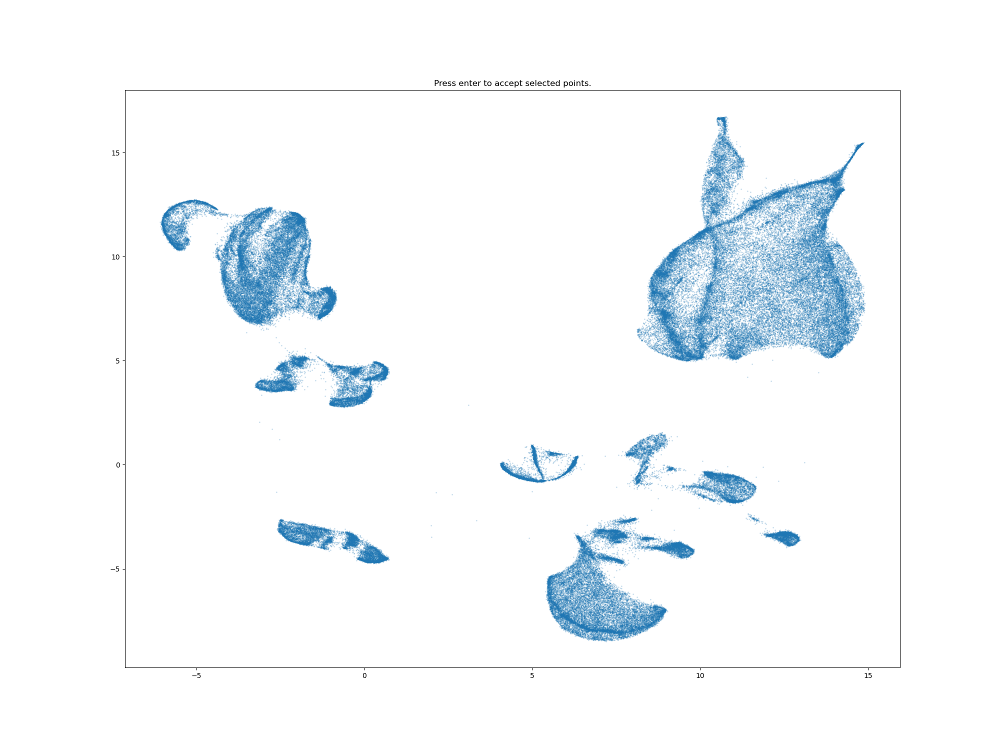

In [301]:
%matplotlib widget
import numpy as np
from matplotlib.widgets import LassoSelector
from matplotlib.path import Path

class SelectFromCollection:
    def __init__(self, ax, collection, alpha_other=0.3):
        self.canvas = ax.figure.canvas
        self.collection = collection
        self.alpha_other = alpha_other

        self.xys = collection.get_offsets()
        self.Npts = len(self.xys)

        # Ensure that we have separate colors for each object
        self.fc = collection.get_facecolors()
        if len(self.fc) == 0:
            raise ValueError('Collection must have a facecolor')
        elif len(self.fc) == 1:
            self.fc = np.tile(self.fc, (self.Npts, 1))

        self.lasso = LassoSelector(ax, onselect=self.onselect)
        self.ind = []

    def onselect(self, verts):
        path = Path(verts)
        self.ind = np.nonzero(path.contains_points(self.xys))[0]
        self.fc[:, -1] = self.alpha_other
        self.fc[self.ind, -1] = 1
        self.collection.set_facecolors(self.fc)
        self.canvas.draw_idle()

    def disconnect(self):
        self.lasso.disconnect_events()
        self.fc[:, -1] = 1
        self.collection.set_facecolors(self.fc)
        self.canvas.draw_idle()


if __name__ == '__main__':
    import matplotlib.pyplot as plt

    # Fixing random state for reproducibility


#     subplot_kw = dict(xlim=(0, 1), ylim=(0, 1), autoscale_on=False)
    fig, ax = plt.subplots(1,1,figsize=(20,15))

    pts = ax.scatter(embedding[:, 0], embedding[:, 1], s=1,alpha=0.2)
    selector = SelectFromCollection(ax, pts)

    def accept(event):
        if event.key == "enter":
            print("Selected points:")
            print(selector.xys[selector.ind])
            selector.disconnect()
            ax.set_title("")
            fig.canvas.draw()
   
    fig.canvas.mpl_connect("key_press_event", accept)
    ax.set_title("Press enter to accept selected points.")

    plt.show()

In [404]:
cluster2=selector.ind.copy()
cluster_labels_=zeros( len(embedding) )
print(shape(cluster2))
for i in cluster2:
    cluster_labels_[i]=1
    
for ii in [132]:
    n=fl2[ii]
    lab_test=loadmat(n+'/nuclear_km_labels_1.mat')['nuclear_km_labels']
    m11=loadmat(n+'/FinalMM.mat')['CalibratedM11']
    cn=int(lab_test.max()+1)
    fin_img=zeros(lab_test.shape[:2])
    for i in range(cn):
        fin_img[lab_test==i]=fin_img[lab_test==i]+cluster_labels_[(ii)*cn:(ii+1)*cn][i]
#plt.savefig('cluster.png', dpi=500, bbox_inches='tight')

(7433,)


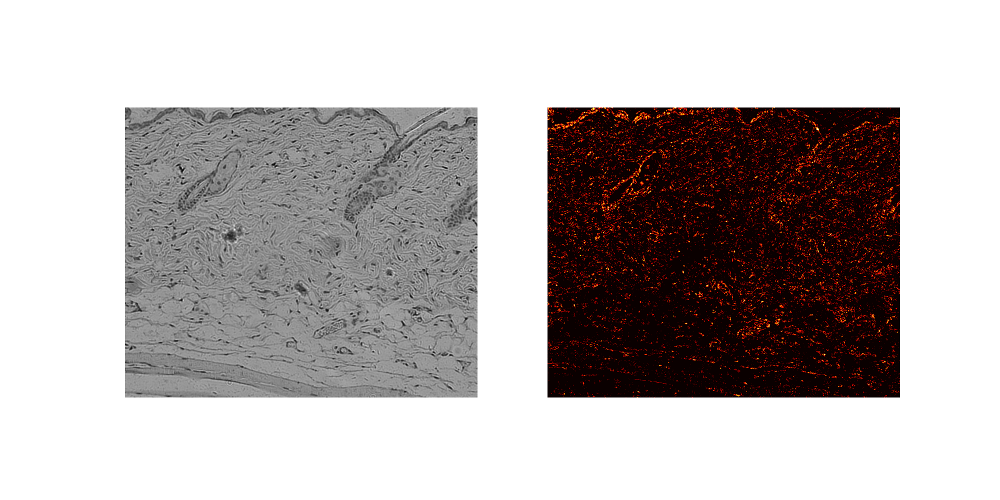

In [405]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,10))
ax1=subplot(1,2,1)
ax1.imshow(m11,cmap='gray')
savemat('m11_2.mat',{'m11':m11})
axis('off')
ax2=subplot(1,2,2)
ax2=imshow(fin_img,'hot')
axis('off')
savemat('fin_img_2.mat',{'fin_img':fin_img})

In [ ]:
print(shape(total_groups2))
print(shape(cluster_labels_))
q=transpose(total_groups2)
a=cluster_labels_[0:12288]*q
b=transpose(a)
T_a=[]
for i in range(0,12288):
    if cluster_labels_[i] == 1:
        T_a.append(b[i,:])    
print(shape(b))
print(shape(T_a))
savemat('T_a.mat',{'T_a':T_a})

# Retry UMAP projection

In [ ]:
%matplotlib widget
import numpy as np
from matplotlib.widgets import LassoSelector
from matplotlib.path import Path

class SelectFromCollection:
    """
    Select indices from a matplotlib collection using `LassoSelector`.

    Selected indices are saved in the `ind` attribute. This tool fades out the
    points that are not part of the selection (i.e., reduces their alpha
    values). If your collection has alpha < 1, this tool will permanently
    alter the alpha values.

    Note that this tool selects collection objects based on their *origins*
    (i.e., `offsets`).

    Parameters
    ----------
    ax : `~matplotlib.axes.Axes`
        Axes to interact with.
    collection : `matplotlib.collections.Collection` subclass
        Collection you want to select from.
    alpha_other : 0 <= float <= 1
        To highlight a selection, this tool sets all selected points to an
        alpha value of 1 and non-selected points to *alpha_other*.
    """

    def __init__(self, ax, collection, alpha_other=0.3):
        self.canvas = ax.figure.canvas
        self.collection = collection
        self.alpha_other = alpha_other

        self.xys = collection.get_offsets()
        self.Npts = len(self.xys)

        # Ensure that we have separate colors for each object
        self.fc = collection.get_facecolors()
        if len(self.fc) == 0:
            raise ValueError('Collection must have a facecolor')
        elif len(self.fc) == 1:
            self.fc = np.tile(self.fc, (self.Npts, 1))

        self.lasso = LassoSelector(ax, onselect=self.onselect)
        self.ind = []

    def onselect(self, verts):
        path = Path(verts)
        self.ind = np.nonzero(path.contains_points(self.xys))[0]
        self.fc[:, -1] = self.alpha_other
        self.fc[self.ind, -1] = 1
        self.collection.set_facecolors(self.fc)
        self.canvas.draw_idle()

    def disconnect(self):
        self.lasso.disconnect_events()
        self.fc[:, -1] = 1
        self.collection.set_facecolors(self.fc)
        self.canvas.draw_idle()


if __name__ == '__main__':
    import matplotlib.pyplot as plt

    # Fixing random state for reproducibility


#     subplot_kw = dict(xlim=(0, 1), ylim=(0, 1), autoscale_on=False)
    fig, ax = plt.subplots(1,1,figsize=(20,15))

    pts = ax.scatter(xxx[:, 0], xxx[:, 1], s=1,alpha=0.2)
    selector = SelectFromCollection(ax, pts)

    def accept(event):
        if event.key == "enter":
            print("Selected points:")
            print(selector.xys[selector.ind])
            selector.disconnect()
            ax.set_title("")
            fig.canvas.draw()
   
    fig.canvas.mpl_connect("key_press_event", accept)
    ax.set_title("Press enter to accept selected points.")

    plt.show()

In [ ]:
#cluster2=selector.ind.copy()
#cluster_labels=zeros( len(xxx) )
#for i in cluster2:
#    cluster_labels_[i]=1
    
for ii in range(len(fl)):
    n=fl[ii]
    print(n)
    lab_test=loadmat(n+'/km_labels.mat')['km_labels']
    cn=int(lab_test.max()+1)
    fin_img=zeros(lab_test.shape[:2])
    for i in range(cn):
        fin_img[lab_test==i]=fin_img[lab_test==i]+cluster_labels_[(ii)*cn:(ii+1)*cn][i]
    savemat(n+'/fin_img_2.mat',{'fin_img':fin_img})

In [561]:
# 这个程序在原来的基础上加了一个mask的功能，可以添加mask后算超像素，没有mask也能正常运行
def Superpixel_preprocessing(data,MMpbp,clustern=1024,Mask=zeros(2)):
    """
    Partition the Mueller matrix data into polarimetric superpixels.
    
    input Mueller matrix loadmat file and MMpbps, set the clustern, outputs the pbps for each
    polarimetric superpixels and their projection labels.
    
    dict, 3d array, int --> 2d array, 2d array
    """
    if sum(Mask) == 0:
        mask=ones(MMpbp.shape[:2])
    else:
        mask=Mask.copy()
    #读矩阵数据
    temp=[]
    parameters = ['FinalM11','FinalM12','FinalM13','FinalM14','FinalM21','FinalM22','FinalM23','FinalM24','FinalM31','FinalM32','FinalM33',
                 'FinalM34','FinalM41','FinalM42','FinalM43','FinalM44']
    for para in parameters:
        temp.append( data[para] )
    MM=stack(temp,axis=2)
    MM[:,:,0]=1.
    labels_ = zeros((MM.shape[0],MM.shape[1]))
    
    #对矩阵阵元进行高斯滤波
    #MM_=zeros(MM.shape)
    #for i in range(1,16):
    #    MM_[:,:,i]=gaussian_filter(MM[:,:,i],5)
    
    #MM=MM_.copy()
    
    #进行超像素计算
    ss=StandardScaler()
    xx=ss.fit_transform(MM[mask==1])
    from sklearn.cluster import MiniBatchKMeans
    minikm=MiniBatchKMeans(n_clusters=clustern,batch_size=256*clustern,random_state=2021214521)
    minikm.fit(xx)
    
    labels_[mask==1]=minikm.labels_
    labels_[mask==0]=-1
    
    #总结以及输出结果
    groups=[]
    for i in range(0,clustern):
        groups.append(MMpbp[labels_==i].mean(axis=0))
    groups=array(groups)
    
    return groups, labels_.reshape(MM.shape[:2])

In [ ]:
# calculate super pixel
import os
ss=StandardScaler()
for file_path in fl:
    print(file_path)
    data = loadmat(file_path+'/FinalMM.mat')
    MMpbp = loadmat(file_path+'/pbps.mat')['pbps']
    # determine if there is a mask
    # 这里是刚刚保存的选中特定类的mask文件名
    mask_flag = "fin_img_2.mat"
    file_list = os.listdir(file_path)
    if mask_flag in file_list:
        empty_mask = loadmat(file_path+'/fin_img_2.mat')['fin_img']
        no_emp_groups,no_emp_km_labels = Superpixel_preprocessing(data,MMpbp,Mask=empty_mask)
    else:
        no_emp_groups,no_emp_km_labels = Superpixel_preprocessing(data,MMpbp)
    # 这是新计算的超像素的文件
    savemat(file_path+'/nuclear_groups_2.mat',{'nuclear_groups':no_emp_groups})
    savemat(file_path+'/nuclear_km_labels_2.mat',{'nuclear_km_labels':no_emp_km_labels})

In [563]:
retry_groups=[]

for path_ in fl:
    file_path=path_+'/'
    retry_groups.append(loadmat(file_path+'nuclear_groups_2')['nuclear_groups'])
retry_groups=concatenate(retry_groups,axis=0)

ss=StandardScaler()
xxx_=ss.fit_transform(retry_groups[:])

In [564]:
print(shape(xxx_))

(159744, 11)


In [565]:
import umap
umap_reducer=umap.UMAP(n_components=2,n_neighbors=30,min_dist=0.0,metric='canberra',spread=1.,
                       verbose=True,random_state=2021214521,n_epochs=200)
trans=umap_reducer.fit(xxx_[:])

UMAP(metric='canberra', min_dist=0.0, n_epochs=200, n_neighbors=30, random_state=2021214521, verbose=True)
Thu Mar  2 08:21:44 2023 Construct fuzzy simplicial set
Thu Mar  2 08:21:44 2023 Finding Nearest Neighbors
Thu Mar  2 08:21:44 2023 Building RP forest with 25 trees
Thu Mar  2 08:21:44 2023 NN descent for 17 iterations
	 1  /  17
	 2  /  17
	 3  /  17
	 4  /  17
	Stopping threshold met -- exiting after 4 iterations
Thu Mar  2 08:21:49 2023 Finished Nearest Neighbor Search
Thu Mar  2 08:21:50 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Thu Mar  2 08:23:56 2023 Finished embedding


In [566]:
xxx=trans.transform(xxx_[:,]).astype('float16')

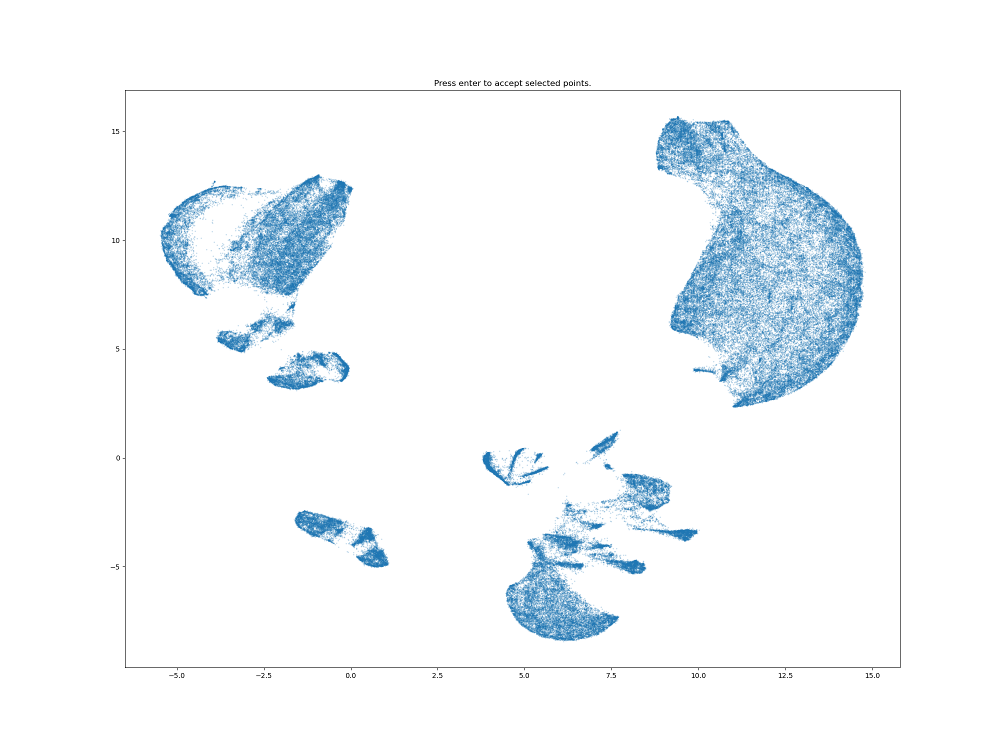

In [569]:
%matplotlib widget
import numpy as np
from matplotlib.widgets import LassoSelector
from matplotlib.path import Path

class SelectFromCollection:
    """
    Select indices from a matplotlib collection using `LassoSelector`.

    Selected indices are saved in the `ind` attribute. This tool fades out the
    points that are not part of the selection (i.e., reduces their alpha
    values). If your collection has alpha < 1, this tool will permanently
    alter the alpha values.

    Note that this tool selects collection objects based on their *origins*
    (i.e., `offsets`).

    Parameters
    ----------
    ax : `~matplotlib.axes.Axes`
        Axes to interact with.
    collection : `matplotlib.collections.Collection` subclass
        Collection you want to select from.
    alpha_other : 0 <= float <= 1
        To highlight a selection, this tool sets all selected points to an
        alpha value of 1 and non-selected points to *alpha_other*.
    """

    def __init__(self, ax, collection, alpha_other=0.3):
        self.canvas = ax.figure.canvas
        self.collection = collection
        self.alpha_other = alpha_other

        self.xys = collection.get_offsets()
        self.Npts = len(self.xys)

        # Ensure that we have separate colors for each object
        self.fc = collection.get_facecolors()
        if len(self.fc) == 0:
            raise ValueError('Collection must have a facecolor')
        elif len(self.fc) == 1:
            self.fc = np.tile(self.fc, (self.Npts, 1))

        self.lasso = LassoSelector(ax, onselect=self.onselect)
        self.ind = []

    def onselect(self, verts):
        path = Path(verts)
        self.ind = np.nonzero(path.contains_points(self.xys))[0]
        self.fc[:, -1] = self.alpha_other
        self.fc[self.ind, -1] = 1
        self.collection.set_facecolors(self.fc)
        self.canvas.draw_idle()

    def disconnect(self):
        self.lasso.disconnect_events()
        self.fc[:, -1] = 1
        self.collection.set_facecolors(self.fc)
        self.canvas.draw_idle()


if __name__ == '__main__':
    import matplotlib.pyplot as plt

    # Fixing random state for reproducibility


#     subplot_kw = dict(xlim=(0, 1), ylim=(0, 1), autoscale_on=False)
    fig, ax = plt.subplots(1,1,figsize=(20,15))

    pts = ax.scatter(xxx[:, 0], xxx[:, 1], s=1,alpha=0.2)
    selector = SelectFromCollection(ax, pts)

    def accept(event):
        if event.key == "enter":
            print("Selected points:")
            print(selector.xys[selector.ind])
            selector.disconnect()
            ax.set_title("")
            fig.canvas.draw()
   
    fig.canvas.mpl_connect("key_press_event", accept)
    ax.set_title("Press enter to accept selected points.")

    plt.show()

In [813]:
cluster1=selector.ind.copy()
print(shape(cluster1))
cluster_labels_=zeros( len(xxx) )
for i in cluster1:
    cluster_labels_[i]=1
    
for ii in [55]:
    n=fl[ii]
    lab_test=loadmat(n+'/nuclear_km_labels_2.mat')['nuclear_km_labels']
    m11=loadmat(n+'/FinalMM.mat')['CalibratedM11']
    cn=int(lab_test.max()+1)
    fin_img=zeros(lab_test.shape[:2])
    for i in range(cn):
        fin_img[lab_test==i]=fin_img[lab_test==i]+cluster_labels_[(ii)*cn:(ii+1)*cn][i]
#plt.savefig('cluster.png', dpi=500, bbox_inches='tight')

(4208,)


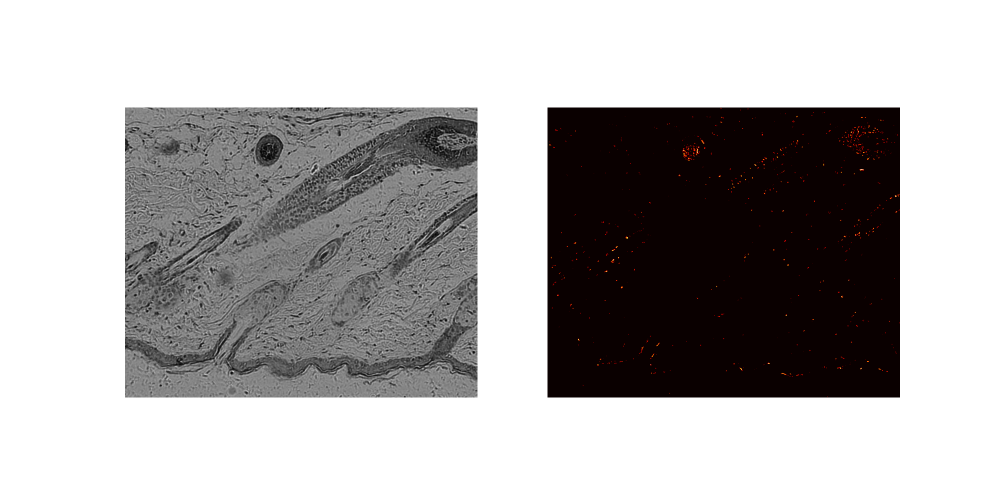

In [814]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,10))
ax1=subplot(1,2,1)
ax1.imshow(m11,cmap='gray')
savemat('m11.mat',{'m11':m11})
axis('off')
ax2=subplot(1,2,2)
ax2=imshow(fin_img,'hot')
axis('off')
savemat('fin_img.mat',{'fin_img':fin_img})

### Correlation coefficient

In [ ]:
import pandas as pd
days=['data/2','data/4','data/6','data/8','data/10','data/12','data/14','data/16','data/18','data/20','data/22','data/24','data/26']
con_a=[]
T_a=[]
pearson=[]
for path_1 in days:
    file_path1=path_1+'/'
    con_a=loadmat(file_path1+'con_a')['con_a']
    for path_2 in days:
        file_path2=path_2+'/'
        T_a=loadmat(file_path2+'T_a')['T_a']
        con_a1=transpose(array(con_a).mean(axis=0))
        T_a1=transpose(array(T_a).mean(axis=0))
        pearson_=corrcoef(con_a1,T_a1)
        pearson.append(pearson_[0,1])
pearson=array(pearson).reshape(13,13)
print(shape(pearson))
print(pearson)
savemat('pearson.mat',{'pearson':pearson})

# Clustering methods

In [ ]:
from sklearn.cluster import KMeans
ac=KMeans(n_clusters=4)
ac.fit(xxx1)
cluster_labels=ac.labels_

In [ ]:
for i in range(0,5):
    scatter(xxx1[cluster_labels==i,0],xxx1[cluster_labels==i,1],s=1,label=str(i))
legend()

# Visualize results

In [ ]:
for ii in [0]:
    n=fl[ii]
    lab_test=loadmat(n+'/km_labels.mat')['km_labels']
    cn=lab_test.max()+1
    fin_img=zeros(lab_test.shape[:2])
    for i in range(cn):
        fin_img[lab_test==i]=fin_img[lab_test==i]+cluster_labels[(ii)*cn:(ii+1)*cn][i]

In [ ]:
imshow(fin_img,'jet')
axis('off')
plt.savefig('cluster.png', dpi=500, bbox_inches='tight')

# Why do we need to select PBPs?

In [ ]:
function_list=['B_b(MM)',
 'B_beta(MM)',
 'B_b_tld(MM)',
 'B_beta_tld(MM)',
 't1(MM)',
 'B_det(MM)',
 'B_norm(MM)',
 'CD(MM)',
 'P_L(MM)',
 'D_L(MM)',
 'r_L(MM)',
 'q_L(MM)',
 'transpose_asym_DP(MM)',
 'transpose_asym_rq(MM)',
 'MM_Det(MM)',
 'MM_Norm(MM)',
 'MM_Trace(MM)',
 'P_vec(MM)',
 'D_vec(MM)',
 'P_dot_D(MM)',
 'P_m_D(MM)',
 'P_mT_D(MM)',
 'MMCD_Lambda1(MM)',
 'MMCD_Lambda2(MM)',
 'MMCD_Lambda3(MM)',
 'MMCD_Lambda4(MM)',
 'MMCD_P1(MM)',
 'MMCD_P2(MM)',
 'MMCD_P3(MM)',
 'MMCD_PI(MM)',
 'MMCD_PD(MM)',
 'MMCD_S(MM)',
 'Es(MM)',
 'E1(MM)',
 'E2(MM)',
 'E3(MM)',
 'E4(MM)',
 'E5(MM)',
 'E6(MM)',
 'MMD_D(MM)',
 'MMD_delta(MM)',
 'MMD_ita(MM)',
 'MMD_R(MM)',
 'MMD_psi(MM)']

In [ ]:
%matplotlib widget
import numpy as np

from matplotlib.widgets import LassoSelector
from matplotlib.path import Path


class SelectFromCollection:
    """
    Select indices from a matplotlib collection using `LassoSelector`.

    Selected indices are saved in the `ind` attribute. This tool fades out the
    points that are not part of the selection (i.e., reduces their alpha
    values). If your collection has alpha < 1, this tool will permanently
    alter the alpha values.

    Note that this tool selects collection objects based on their *origins*
    (i.e., `offsets`).

    Parameters
    ----------
    ax : `~matplotlib.axes.Axes`
        Axes to interact with.
    collection : `matplotlib.collections.Collection` subclass
        Collection you want to select from.
    alpha_other : 0 <= float <= 1
        To highlight a selection, this tool sets all selected points to an
        alpha value of 1 and non-selected points to *alpha_other*.
    """

    def __init__(self, ax, collection, alpha_other=0.3):
        self.canvas = ax.figure.canvas
        self.collection = collection
        self.alpha_other = alpha_other

        self.xys = collection.get_offsets()
        self.Npts = len(self.xys)

        # Ensure that we have separate colors for each object
        self.fc = collection.get_facecolors()
        if len(self.fc) == 0:
            raise ValueError('Collection must have a facecolor')
        elif len(self.fc) == 1:
            self.fc = np.tile(self.fc, (self.Npts, 1))

        self.lasso = LassoSelector(ax, onselect=self.onselect)
        self.ind = []

    def onselect(self, verts):
        path = Path(verts)
        self.ind = np.nonzero(path.contains_points(self.xys))[0]
        self.fc[:, -1] = self.alpha_other
        self.fc[self.ind, -1] = 1
        self.collection.set_facecolors(self.fc)
        self.canvas.draw_idle()

    def disconnect(self):
        self.lasso.disconnect_events()
        self.fc[:, -1] = 1
        self.collection.set_facecolors(self.fc)
        self.canvas.draw_idle()


if __name__ == '__main__':
    import matplotlib.pyplot as plt

    # Fixing random state for reproducibility


#     subplot_kw = dict(xlim=(0, 1), ylim=(0, 1), autoscale_on=False)
    fig, ax = plt.subplots()

    pts = ax.scatter(xxx[:, 0], xxx[:, 1], s=1,alpha=0.2)
    selector = SelectFromCollection(ax, pts)

    def accept(event):
        if event.key == "enter":
            print("Selected points:")
            print(selector.xys[selector.ind])
            selector.disconnect()
            ax.set_title("")
            fig.canvas.draw()

    fig.canvas.mpl_connect("key_press_event", accept)
    ax.set_title("Press enter to accept selected points.")

    plt.show()

In [ ]:
Cluster_2=selector.ind.copy()

In [ ]:
cluster_labels_=zeros( len(xxx) )
for i in Cluster_1:
    cluster_labels_[i]=1
for i in Cluster_2:
    cluster_labels_[i]=2

In [ ]:
from sklearn.metrics import precision_recall_curve,roc_curve,auc,accuracy_score

In [ ]:
g1=xxx_[cluster_labels_==1,]
g2=xxx_[cluster_labels_==2,]

In [ ]:
for nnn in range(total_groups.shape[1]):
    fpr,tpr,thresholds=roc_curve(
            array([1]*len(g1)+[0]*len(g2)),
    concatenate([g1[:,nnn],g2[:,nnn]]))
    print( max(around(1-auc(tpr, fpr),5),around(auc(tpr, fpr),5)),function_list[nnn] ,nnn)

In [ ]:
n=25
some_pbp=total_groups[:,n].copy()

some_pbp[some_pbp>percentile(some_pbp,99)]=percentile(some_pbp,99)
some_pbp[some_pbp<percentile(some_pbp,1)]=percentile(some_pbp,1)
# hist(some_pbp,10)

colors_=zeros((some_pbp.shape[0],4))
colors = cm.jet(np.linspace(0, 1, 30))

for i in range(30):
    rangess=( histogram(some_pbp,30)[1][i],histogram(some_pbp,30)[1][i+1] )
    colors_[ (some_pbp< rangess[1])*(some_pbp> rangess[0])  ]=colors_[ (some_pbp< rangess[1])*(some_pbp> rangess[0])  ]+colors[i]
scatter(xxx[:,0],xxx[:,1],s=0.1,alpha=1,c=colors_)
colorbar()

In [ ]:
inds=array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 39, 40, 41, 42])

# Retry

In [ ]:
umap_reducer=umap.UMAP(n_components=2,n_neighbors=30,min_dist=0,metric='canberra',spread=1.,
                       verbose=True,random_state=2021312732,n_epochs=200)
umap_reducer.fit(xxx_[:,inds] )

In [ ]:
umap.plot.points(umap_reducer,theme='inferno')

In [ ]:
xxx=umap_reducer.transform(xxx_[:,inds]).astype('float16')

from sklearn.cluster import AgglomerativeClustering,KMeans
# ac=AgglomerativeClustering(n_clusters=5,)
ac=KMeans(n_clusters=4)
ac.fit(xxx)
cluster_labels=ac.labels_

In [ ]:
for i in range(0,8):
    scatter(xxx[cluster_labels==i,0],xxx[cluster_labels==i,1],s=1,label=str(i))
legend()

In [ ]:
hist(log(total_groups[:,9]),)

In [ ]:
for ii in [1]:
    n=fl[ii]
    lab_test=loadmat(n+'/km_labels.mat')['km_labels']
    cn=lab_test.max()+1
    fin_img=zeros(lab_test.shape[:2])
    for i in range(cn):
        fin_img[lab_test==i]=fin_img[lab_test==i]+cluster_labels[(ii)*cn:(ii+1)*cn][i]

In [ ]:
imshow(fin_img,'jet')
axis('off')